# CCD 관측 자료 전처리

* 이 노트북을 구글 코랩에서 실행하고자 한다면 [파일] - [드라이브에 사본 저장]을 하여 본인의 소유로 만든 후에 코드를 실행하거나 수정할 수 있습니다.

* 이 파일은 실제 수업에 사용하므로 필요에 따라 예고 없이 변경될 수 있습니다.

* If you have any questions or comments on this document, please email me(Kiehyun.Park@gmail.com).

* 이 파일(문서)는 공교육 현장에서 수업시간에 자유롭게 사용할 수 있으나, 다른 목적으로 사용할 시에는 사전에 연락을 주셔서 상의해 주시기 바랍니다.



천체 관측 중 CCD(charge couple device) 관측 자료를 이용하여 측광의 기본인 전처리 과정을 다룹니다.

## 필요한 환경

이 프로젝트를 위해서는 아래의 모듈이 필요합니다.

> numpy, matplotlib, ccdproc, astropy, gdown, version_information



### 한글 폰트 설치 (matplotlib에서 한글 폰트 깨질 경우)

구글 코랩에서 현재의 Jupyter notebook을 실행한다면 matplotlib 그래프에 한글을 사용하기 위해서 폰트를 설치해야 합니다.

아래 코드의 주석을 제거한 후에 셀을 실해 주세요. 그리고 나서 런타임 다시 시작을 해 줘야 matplotlib 그래프에서 한글을 사용할 수 있습니다.

In [ ]:
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf

#### 런타임 다시 시작

위의 셀을 실행한 다음 반드시 다음 과정을 수행해 주세요...

* [메뉴]-[런타임]-[런터임 다시 시작]

* [메뉴]-[런타임]-[이전 셀 실행]

#### 한글 폰트 사용

위에서 한글 폰트를 설치하고, 런타임 다시시작을 했다면 구글 코랩에서 폰트 경로를 설정하여 한글 사용이 가능해 집니다.

In [ ]:
#visualization
import matplotlib as mpl
import matplotlib.pylab as pl
import matplotlib.pyplot as plt

# 브라우저에서 바로 그려지도록
%matplotlib inline

# 그래프에 retina display 적용
%config InlineBackend.figure_format = 'retina'

# Colab 의 한글 폰트 설정
# plt.rc('font', family='NanumBarunGothic')

# 유니코드에서  음수 부호설정
mpl.rc('axes', unicode_minus=False)

### 모듈 설치 및 버전 확인

아래 셀을 실행하면 이 노트북을 실행하는데 필요한 모듈을 설치하고 파이썬 및 관련 모듈의 버전을 확인할 수 있습니다.

In [19]:
import importlib, sys, subprocess
packages = "numpy, matplotlib, ccdproc, astropy, gdown, version_information" # required modules
pkgs = packages.split(", ")
for pkg in pkgs :
    if not importlib.util.find_spec(pkg):
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', pkg, '-q'])
        print(f"**** {pkg} module is now being installed.")
    else:
        print(f"******** {pkg} module is already installed.")
%load_ext version_information
import time
now = time.strftime("%Y-%m-%d %H:%M:%S (%Z = GMT%z)")
print(f"This notebook was generated at {now} ")

vv = %version_information {packages}
for i, pkg in enumerate(vv.packages):
    print(f"{i} {pkg[0]:10s} {pkg[1]:s}")

******** numpy module is already installed.
******** matplotlib module is already installed.
**** ccdproc module is now being installed.
******** astropy module is already installed.
******** gdown module is already installed.
**** version_information module is now being installed.
This notebook was generated at 2024-10-27 13:06:02 (UTC = GMT+0000) 
0 Python     3.10.12 64bit [GCC 11.4.0]
1 IPython    7.34.0
2 OS         Linux 6.1.85+ x86_64 with glibc2.35
3 numpy      1.26.4
4 matplotlib 3.7.1
5 ccdproc    2.4.2
6 astropy    6.1.4
7 gdown      5.2.0
8 version_information 1.0.4


## 데이터 저장

### 데이터 저장 폴더 생성

데이터를 저장할 폴더를 "preprocessing_example" 라는 이름으로 생성해 보겠습니다.

* 만약 리눅스 시스템 이라면 shell 명령어로 가능한데, "!"를 붙이면 shell 명령어를 실행할 수 있습니다.
> !mkdir preprocessing_example

아래 코드를 실행하면 OS의 영향을 받지 않기 위하여 pathlib을 사용하여 폴더를 생성할 수 있습니다.

In [5]:
import os
from pathlib import Path
BASEPATH = Path("./")
save_dir_name = "preprocessing_example"
print(f"BASEPATH: {BASEPATH}")

if not (BASEPATH/save_dir_name).exists():
    os.mkdir(str(BASEPATH/save_dir_name))
    print (f"{str(BASEPATH/save_dir_name)} is created...")
else :
    print (f"{str(BASEPATH/save_dir_name)} is already exist...")

BASEPATH: .
preprocessing_example is created...


shell 명령어로 폴더가 생성되었는지 확인해 봅니다.

폴더 생성을 확인하는 또 다른 방법은 이 창 오른쪽에서 [파일] 목록을 확인해 볼 수 있습니다.

In [20]:
!ls -al

total 20
drwxr-xr-x 1 root root 4096 Oct 27 13:04 .
drwxr-xr-x 1 root root 4096 Oct 27 13:02 ..
drwxr-xr-x 4 root root 4096 Oct 24 13:20 .config
drwxr-xr-x 2 root root 4096 Oct 27 13:04 preprocessing_example
drwxr-xr-x 1 root root 4096 Oct 24 13:20 sample_data


### CCD 관측 데이터 다운로드

경기과학고등학교 천문대에서 CCD로 관측한 이미지 (예제 fits files)을 구글 드라이브에 저장해 놓았습니다. wget 명령을 사용하여 다음과 같이 구글 코랩 [작업 영역]에 다운로드 받아 보겠습니다.

*   bias frame : 5장
*   dark frame : 140sec 5장, 180sec 4장
*   flat frame : 5장
*   object frame : M15 60sec 5장, M35 140sec 10장

파일의 갯수가 많아서 하나의 압축파일로 저장해 놓은 것을 받아 보도록 하겠습니다.



### gdown

구글 드라이브에 저장된 파일을 wget으로 다운받는 경우 용량의 제한이 있습니다. 이를 해결할 수 있는 방법 중의 하나가 gdown을 이용하는 것입니다.

In [6]:
fname = "preprocessing_example.zip"
fid = "1o2YV3Z_G5BIl-MtKg9ng2lTV6W3eHMmU"

# gdown을 이용(나의 구글드라이브에서 공유한 파일을 다운로드)
!gdown {fid} -O {save_dir_name}/{fname}

Downloading...
From (original): https://drive.google.com/uc?id=1o2YV3Z_G5BIl-MtKg9ng2lTV6W3eHMmU
From (redirected): https://drive.google.com/uc?id=1o2YV3Z_G5BIl-MtKg9ng2lTV6W3eHMmU&confirm=t&uuid=ed819194-ddcb-498d-9c2e-1475a1a14294
To: /content/preprocessing_example/preprocessing_example.zip
100% 187M/187M [00:05<00:00, 31.3MB/s]


### 데이터 확인

* 코랩을 사용할 경우에는 오른쪽의 [파일]창에서 확인할 수 있습니다.
* linux shell 명령어로 다음과 같이 확인해 볼 수 있습니다.
> ls -l preprocessing_example

OS의 영향을 받지 않고 파이썬으로 확인하는 방법은 아래와 같이 하면 됩니다.

In [7]:
from pathlib import Path
fpaths = sorted(list((BASEPATH/save_dir_name).glob('*.zip')))
print(f"fpaths: {fpaths}")
print(f"len(fpaths): {len(fpaths)}")

fpaths: [PosixPath('preprocessing_example/preprocessing_example.zip')]
len(fpaths): 1


### 압축 풀기


In [8]:
import shutil

shutil.unpack_archive(str(fpaths[0]), str(BASEPATH/save_dir_name))
print(str(fpaths[0]), "is unpacked to", str(BASEPATH/save_dir_name))

preprocessing_example/preprocessing_example.zip is unpacked to preprocessing_example


In [9]:
# from zipfile import ZipFile
# with ZipFile(str(fpaths[0]), 'r') as zip_ref:
#     zip_ref.extractall(str(BASEPATH/save_dir_name))
#     print(str(fpath[0]), "is unpacked to", str(BASEPATH/save_dir_name))

### 압축 해제된 파일 확인

shell 명령어로 파일이 생성되었는지 확인해 보자.
역시 마찬가지로 이 창 오른쪽에서 [파일] 목록을 확인해 볼 수 있습니다.

In [10]:
fpaths = sorted(list((BASEPATH/save_dir_name).glob('*.fit*')))
print(f"fpaths: {fpaths}")
print(f"len(fpaths): {len(fpaths)}")

fpaths: [PosixPath('preprocessing_example/M15-g00001.fit'), PosixPath('preprocessing_example/M15-g00002.fit'), PosixPath('preprocessing_example/M15-g00003.fit'), PosixPath('preprocessing_example/M15-g00004.fit'), PosixPath('preprocessing_example/M15-g00005.fit'), PosixPath('preprocessing_example/M35-g3035781.fit'), PosixPath('preprocessing_example/M35-g3035782.fit'), PosixPath('preprocessing_example/M35-g3035783.fit'), PosixPath('preprocessing_example/M35-g3035784.fit'), PosixPath('preprocessing_example/M35-g3035785.fit'), PosixPath('preprocessing_example/M35-g3035786.fit'), PosixPath('preprocessing_example/M35-g3035787.fit'), PosixPath('preprocessing_example/M35-g3035788.fit'), PosixPath('preprocessing_example/M35-g3035789.fit'), PosixPath('preprocessing_example/M35-g3035790.fit'), PosixPath('preprocessing_example/bias-e-2X2-001.fit'), PosixPath('preprocessing_example/bias-e-2X2-002.fit'), PosixPath('preprocessing_example/bias-e-2X2-003.fit'), PosixPath('preprocessing_example/bias-e-2

## About fits file

천문학에서는 확장자가 '.fits'인 파일이 널리 쓰입니다. FITS는 'Flexible Image Transport System'이란 뜻인데, 한 파일에 여러 프레임의 이미지를 저장할 수 있어서 관측 이미지를 담는 파일에 주로 쓰입니다.

Python에서는 주로 ccdproc, astropy 패키지를 이용하면 FITS 파일을 다룰 수 있게 됩니다.

### Load files

fits file을  읽어 확인해 보겠습니다.

In [11]:
from astropy.io import fits

fpath = Path(fpaths[0])
print(f"fpath: {fpath}")
print(f"type(fpath): {type(fpath)}")

hdul = fits.open(str(fpath), unit="adu")

print("type(hdul) :", type(hdul))
print("type(hdul[0]) :", type(hdul[0]))

DELMAG   =   0.0000            /Veriable - Comparison,   Delmag                  [astropy.io.fits.card]
DELMAG   =   0.0000            /Veriable - Comparison,   Delmag                 


fpath: preprocessing_example/M15-g00001.fit
type(fpath): <class 'pathlib.PosixPath'>
type(hdul) : <class 'astropy.io.fits.hdu.hdulist.HDUList'>
type(hdul[0]) : <class 'astropy.io.fits.hdu.image.PrimaryHDU'>


### header

ccds라는 이름에 HDUList들이 리스트 형태로 들어 있습니다. 각각의 hdulist는 2차원 이므로 index는 [0]번만 존재합니다.

In [12]:
print("type(hdul[0].hedaer) :", type(hdul[0].header))
hdul[0].header

type(hdul[0].hedaer) : <class 'astropy.io.fits.header.Header'>


SIMPLE  =                    T /                                                
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =                  1.0 /physical = BZERO + BSCALE*array_value           
BZERO   =              32768.0 /physical = BZERO + BSCALE*array_value           
OBSERVAT= 'GSHS      '         /Observatory                                     
DETECTOR= 'GSHS 0.6m STX-16803'/instrument or camera used                       
OBSERVER= 'GSHS         '      /Observer                                        
IMAGETYP= 'LIGHT   '           / Type of image                                  
FILTER  = 'V'                  /Filter of image                                 
OBJECT  = 'M15     '        

header는 key와 value가 들어 있습니다.

In [13]:
print("hdul[0].hedaer['DATE-OBS'] :", hdul[0].header['DATE-OBS'])
print("type(hdul[0].hedaer['DATE-OBS']) :", type(hdul[0].header['DATE-OBS']))

hdul[0].hedaer['DATE-OBS'] : 2016-11-15T09:12:57
type(hdul[0].hedaer['DATE-OBS']) : <class 'str'>


### data

관측 자료는 numpy.ndarray 형태로 들어 있음을 알 수 있습니다.

In [14]:
print("type(hdul[0].data) :", type(hdul[0].data))
print("hdul[0].data.dtype :", hdul[0].data.dtype)
print("hdul[0].data.shape :", hdul[0].data.shape)
print("hdul[0].data :", hdul[0].data)

type(hdul[0].data) : <class 'numpy.ndarray'>
hdul[0].data.dtype : uint16
hdul[0].data.shape : (2048, 2048)
hdul[0].data : [[7682 7453 7480 ... 6088 5991 6048]
 [7684 7567 7561 ... 5988 6051 6041]
 [7657 7576 7389 ... 5966 5965 6003]
 ...
 [7683 7522 7532 ... 5835 5828 5909]
 [7760 7740 7677 ... 5989 6128 6047]
 [4686 4708 4814 ... 3802 3830 3787]]


## 바이어스 오차

바이어스 오차(bias error)는 CCD 관측 각 픽셀 초기 값이 0 이 되어야 하는데, 실제로는 그렇지 않기 때문에 생기는 noise 입니다. 이 noise는 픽셀들의 기계적인 원인 때문에 발생하는 것이며 관측시 각 픽셀들은 몇 개의 전자를 가지고 관측을 시작하게 됩니다.
이러한 전자에 의해 생기는 noise는 bias image를 촬영하여 다음의 과정으로 보정할 수 있습니다.

* 광자가 모이기 힘들 정도의 최대한 짧은 exposure time으로 bais image를 가능한 한 여려 장(10 ~ 20 frame) 촬영 합니다.

* all bias image를 median 방법으로 combine 하여 얻은 master bias image를 "bias-median.fits"로 저장 합니다.

* bias image는 filter에 무관합니다.

* 다만 저장시에 data type에 유의해야 하는데, ccdproc로 저장한후 data type을 확인하는 것이 좋습니다.


### bias 파일 리스트 만들기

파일 이름에 규칙성이 있다면 이를 이용하여 다음과 같이 파일 경로를 리스트로 만들어서 사용할 수 있습니다.

In [15]:
bias_list = sorted(list((BASEPATH/save_dir_name).glob('*bias-e*.fit*')))
print(f"bias_list: {bias_list}")
print(f"len(bias_list): {len(bias_list)}")

bias_list: [PosixPath('preprocessing_example/bias-e-2X2-001.fit'), PosixPath('preprocessing_example/bias-e-2X2-002.fit'), PosixPath('preprocessing_example/bias-e-2X2-003.fit'), PosixPath('preprocessing_example/bias-e-2X2-004.fit'), PosixPath('preprocessing_example/bias-e-2X2-005.fit')]
len(bias_list): 5


### zimshow 함수

fits file을 화면에 display 할때 아래의 함수를 사용하면 매우 유용합니다.

In [16]:
from warnings import warn
from astropy.visualization import (
    ImageNormalize,
    LinearStretch,
    ZScaleInterval,
    simple_norm,
)

def znorm(image, stretch=LinearStretch(), **kwargs):
    return ImageNormalize(image, interval=ZScaleInterval(**kwargs), stretch=stretch)

def zimshow(
    ax,
    image,
    stretch=LinearStretch(),
    cmap=None,
    origin="lower",
    zscale_kw={},
    **kwargs
):
    im = ax.imshow(
        image,
        norm=znorm(image, stretch=stretch, **zscale_kw),
        origin=origin,
        cmap=cmap,
        **kwargs
    )
    return im

def norm_imshow(
    ax,
    data,
    origin="lower",
    stretch="linear",
    power=1.0,
    asinh_a=0.1,
    min_cut=None,
    max_cut=None,
    min_percent=None,
    max_percent=None,
    percent=None,
    clip=True,
    log_a=1000,
    invalid=-1.0,
    zscale=False,
    vmin=None,
    vmax=None,
    **kwargs
):
    """Do normalization and do imshow"""
    if vmin is not None and min_cut is not None:
        warn("vmin will override min_cut.")

    if vmax is not None and max_cut is not None:
        warn("vmax will override max_cut.")

    if zscale:
        zs = ImageNormalize(data, interval=ZScaleInterval())
        min_cut = vmin = zs.vmin
        max_cut = vmax = zs.vmax

    if vmin is not None or vmax is not None:
        im = ax.imshow(data, origin=origin, vmin=vmin, vmax=vmax, **kwargs)
    else:
        im = ax.imshow(
            data,
            origin=origin,
            norm=simple_norm(
                data=data,
                stretch=stretch,
                power=power,
                asinh_a=asinh_a,
                min_cut=min_cut,
                max_cut=max_cut,
                min_percent=min_percent,
                max_percent=max_percent,
                percent=percent,
                clip=clip,
                log_a=log_a,
                invalid=invalid
            ),
            **kwargs)
    return im

### 이미지 display

preprocessing_example/bias-e-2X2-001.fit


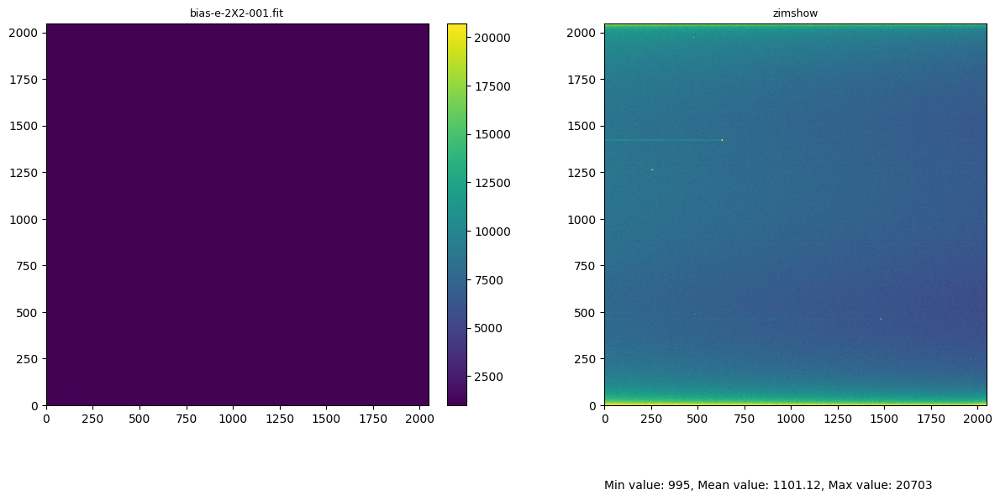

In [17]:
fpath = bias_list[0]
print(fpath)
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
hdul = fits.open(fpath)

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = axs[0].imshow(hdul[0].data,
            origin='lower',
            cmap='viridis',
                    )

im2 = zimshow(axs[1],
            hdul[0].data,
            cmap='viridis',
            )

axs[0].set_title(f'{fpath.name}', fontsize=9)
axs[1].set_title('zimshow', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### master bias 만들기

ccdproc의 combine 함수를 이용하면 여러 장의 bias 이미지를 통계적으로 처리할 수 있습니다.

기본적으로는 여러장의 이미지로부터 각 픽셀의 통계값을 구하는데 기본은 average 값을 구하게 됩니다. 만약 median 값을 구하고자 하는 경우 method를 "median"을 입력해 주면 되며, 마스타 바이어스 프레임은 "median"이 더 유용할 것으로 생각됩니다.

In [21]:
from ccdproc import combine

method = "median"

bias = combine(bias_list,       # ccdproc does not accept numpy.ndarray, but only python list.
               method = method,         # default is average so I specified median.
               unit='adu')

print("type(bias) :", type(bias))

type(bias) : <class 'astropy.nddata.ccddata.CCDData'>


### bias 확인하기

In [22]:
print("dir(bias) :", dir(bias))
print("type(bias.data) :", type(bias.data))

dir(bias) : ['__abstractmethods__', '__array__', '__array_wrap__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_arithmetic', '_arithmetic_data', '_arithmetic_mask', '_arithmetic_meta', '_arithmetic_uncertainty', '_arithmetic_wcs', '_data', '_flags', '_handle_wcs_slicing_error', '_insert_in_metadata_fits_safe', '_mask', '_meta', '_prepare_then_do_arithmetic', '_psf', '_slice', '_slice_mask', '_slice_uncertainty', '_slice_wcs', '_uncertainty', '_unit', '_wcs', 'add', 'convert_unit_to', 'copy', 'data', 'divide', 'dtype', 'flags', 'header', 'known_invalid_fits_unit_strings', 'mask', 'max', 'mean', 'meta', 'min', 'multiply', 'ndim', 'psf', 'read', 'shape', 'size', 'su

### dtype 바꾸기



In [23]:
print("bias.data.dtype :", type(bias.data.dtype))
bias.data = bias.data.astype(np.float32)
print("bias.data.dtype :", type(bias.data.dtype))

bias.data.dtype : <class 'numpy.dtypes.Float64DType'>
bias.data.dtype : <class 'numpy.dtypes.Float32DType'>


### 저장하기


In [24]:
bias.write(f"{(BASEPATH/save_dir_name)}/master_bais_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_bais_{method}.fits is created...")

preprocessing_example/master_bais_median.fits is created...


### 화면에 출력하기

화면에 디스플레이 해 보자.

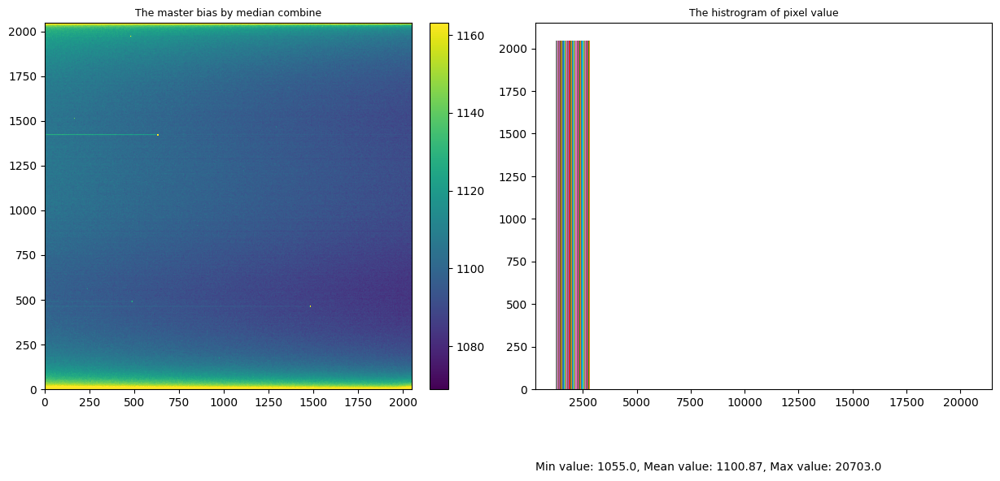

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], bias.data,
            origin='lower',)

im2 = axs[1].hist(bias.data,
                )

axs[0].set_title(f'The master bias by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {bias.data.min()}, Mean value: {bias.data.mean():.02f}, Max value: {bias.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

히스토그램에서 보면 대부분 BIAS 평균값이 1,100 ADU 정도인데, 20,000 ADU 정도에 해당하는 픽셀이 있어 자료를 잘 확인할 수 없다.
히스토그램에서 범위를 평균값의 10 % 내외로 설정하여 확인해 보자.

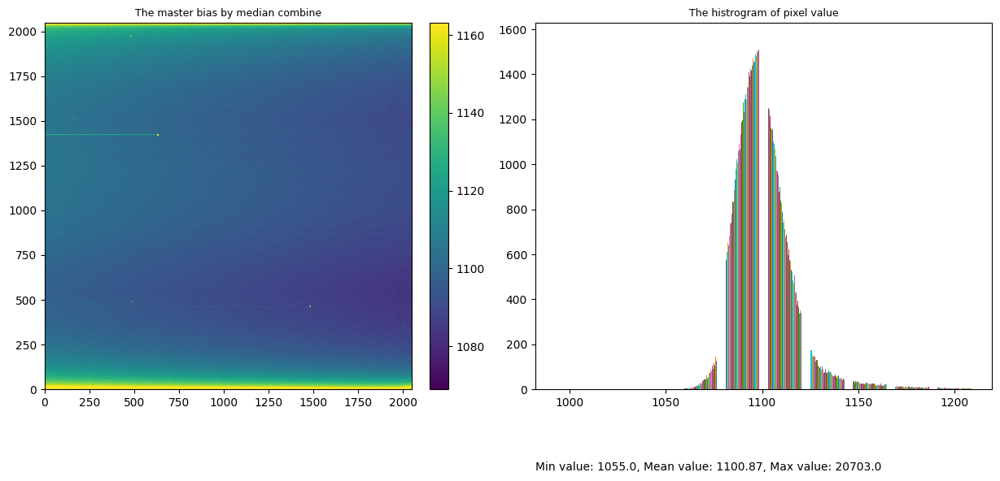

In [26]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            bias.data,
            cmap='viridis',
            origin='lower',)

im2 = axs[1].hist(bias.data,
                  range=(bias.data.mean()*.9, bias.data.mean()*1.1),
                  )

axs[0].set_title(f'The master bias by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {bias.data.min()}, Mean value: {bias.data.mean():.02f}, Max value: {bias.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

한장의 파일과 어떤 차이가 있는지 비교해 보자.

preprocessing_example/bias-e-2X2-001.fit


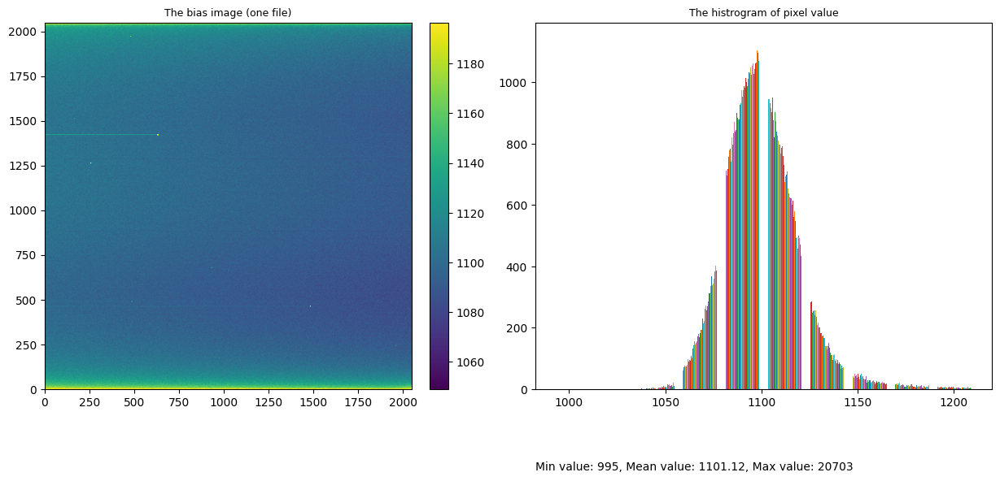

In [27]:
fpath = bias_list[0]
print(fpath)
hdul = fits.open(fpath)

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            hdul[0].data,
            cmap='viridis',
            origin='lower',)

im2 = axs[1].hist(hdul[0].data,
                  range=(hdul[0].data.mean()*.9, hdul[0].data.mean()*1.1),
                  )

axs[0].set_title(f'The bias image (one file)', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### 부분 확대해서 확인하기

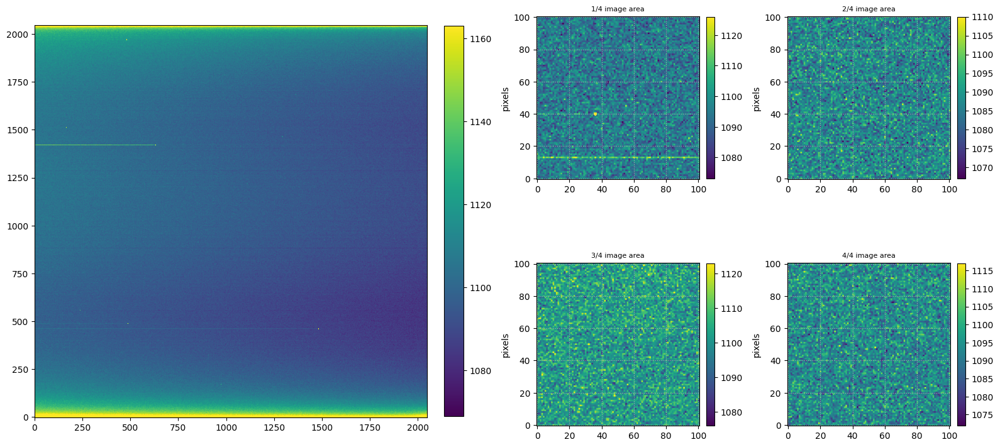

In [28]:
import numpy as np
from astropy.nddata import Cutout2D

fig_set = plt.figure(figsize=(16, 8))

ax1 = plt.subplot2grid((2,4), (0,0),
                    colspan=2, rowspan=2,
                    fig=fig_set)
im1 = zimshow(ax1,
            bias.data,
            origin='lower',
            cmap='viridis',
            )
plt.colorbar(im1,
             ax = ax1,
             fraction=0.0455, pad=0.04)

cutsizes = 101
#1/4 area
ax20 = plt.subplot2grid((2,4), (0,2),
                       fig=fig_set)

cut_hdu = Cutout2D(
            data = bias.data,
            position = (500, 500),
            size=(cutsizes, cutsizes) #cut ccd
            )
im20 = zimshow(ax20,
        cut_hdu.data,
        origin='lower',
        cmap='viridis',
    )
ax20.set_ylabel('pixels')
ax20.grid(ls=':')
ax20.set_title(f'1/4 image area', fontsize=8)
plt.colorbar(im20,
            ax=ax20,
            fraction=0.0455, pad=0.04)

#2/4 area
ax21 = plt.subplot2grid((2,4), (0,3),
                       fig=fig_set)

cut_hdu = Cutout2D(
            data = bias.data,
            position = (bias.data.shape[1] - 500, 500),
            size=(cutsizes, cutsizes) #cut ccd
            )
im21 = zimshow(ax21,
        cut_hdu.data,
        origin='lower',
        cmap='viridis',
    )

ax21.set_ylabel('pixels')
ax21.grid(ls=':')
ax21.set_title(f'2/4 image area', fontsize=8)
plt.colorbar(im21,
            ax=ax21,
            fraction=0.0455, pad=0.04)

#3/4 area
ax30 = plt.subplot2grid((2,4), (1,2),
                       fig=fig_set)

cut_hdu = Cutout2D(
            data = bias.data,
            position = (500, bias.data.shape[0] - 500),
            size=(cutsizes, cutsizes) #cut ccd
            )
im30 = zimshow(ax30,
        cut_hdu.data,
        origin='lower',
        cmap='viridis',
    )
ax30.set_ylabel('pixels')
ax30.grid(ls=':')
ax30.set_title(f'3/4 image area', fontsize=8)
plt.colorbar(im30,
            ax=ax30,
            fraction=0.0455, pad=0.04)

#4/4 area
ax31 = plt.subplot2grid((2,4), (1,3),
                       fig=fig_set)

cut_hdu = Cutout2D(
            data = bias.data,
            position = (bias.data.shape[1] - 500, bias.data.shape[0] - 500),
            size=(cutsizes, cutsizes) #cut ccd
            )
im31 = zimshow(ax31,
        cut_hdu.data,
        origin='lower',
        cmap='viridis',
    )
ax31.set_ylabel('pixels')
ax31.grid(ls=':')
ax31.set_title(f'4/4 image area', fontsize=8)
plt.colorbar(im31,
            ax=ax31,
            fraction=0.0455, pad=0.04)

plt.tight_layout()
plt.show()

아래 코드는 생성형 AI에게 요청하여 위의 코드를 함수로 정리한 것이다.

In [29]:
import matplotlib.patches as patches

def plot_image_with_cutouts(all_data, cutsizes=101):
    fig_set = plt.figure(figsize=(16, 8))

    def add_subplot(position, data, title):
        ax = plt.subplot2grid((2,4), position, fig=fig_set)
        im = zimshow(ax, data, origin='lower')
        ax.set_ylabel('pixels')
        ax.grid(ls=':')
        ax.set_title(title, fontsize=8)
        plt.colorbar(im, ax=ax, fraction=0.0455, pad=0.04)
        return im

    def add_rectangle(x, y, label):
        rect = patches.Rectangle((x, y), cutsizes,
                                cutsizes, linewidth=1,
                                edgecolor='r', facecolor='none')
        ax1.add_patch(rect)
        ax1.text(x, y, label)

    # 전체 이미지
    ax1 = plt.subplot2grid((2,4), (0,0), colspan=2, rowspan=2, fig=fig_set)
    im1 = zimshow(ax1, all_data, origin='lower', cmap='viridis')
    ax1.set_title('The whole image', fontsize=9)
    plt.colorbar(im1, ax=ax1, fraction=0.0455, pad=0.04)

    # 4개의 부분 이미지
    positions = [(0,2), (0,3), (1,2), (1,3)]
    corners = [(500, all_data.shape[0] - 500),
                (all_data.shape[1] - 500, all_data.shape[0] - 500),
                (500, 500),
                (all_data.shape[1] - 500, 500),
                ]

    for i, (pos, corner) in enumerate(zip(positions, corners), 1):
        cut_hdu = Cutout2D(data=all_data, position=corner, size=(cutsizes, cutsizes))
        add_subplot(pos, cut_hdu.data, f'{i}/4 image area')
        add_rectangle(corner[0], corner[1], f"{i}/4")

    plt.tight_layout()
    plt.show()

# 함수 사용 예
# plot_image_with_cutouts(bias.data)

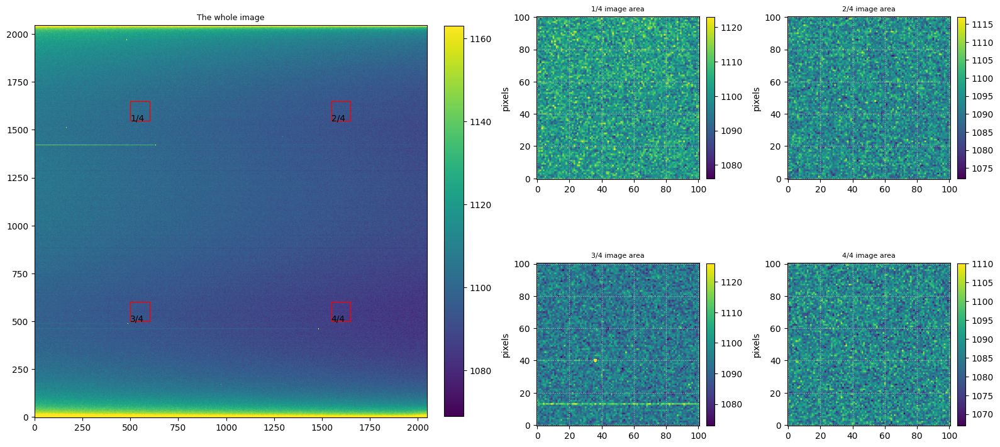

In [30]:
# 함수 사용 예
plot_image_with_cutouts(bias.data)

## 열화 노이즈

암전류(dark current)는 CCD가 빛을 받지 않더라도 실리콘 격자의 열진동에 의하여 pixel에서 만들어진 신호를 말하며 이를 열화 노이즈라고 합니다. 즉, 실리콘 격자의 온도가 높으면 가전자의 일부가 튀어나오게 되는데 이러한 전자들이 신호를 만들게 됩니다. 이러한 암전류는 온도가 높을수록, 그리고 exposure time에 비례하게 나타납니다.

CCD를 냉각하여 dark current를 줄여줄 수 있으나, 완전히 제거할 수는 없으므로 dark frame을 촬영하여 이를 제거해 줍니다. dark current는 시간의 linear function 이므로 dark image의 exposure time을 $t$ second라 한다면 $dark(t)$는 다음과 같이 구할 수 있습니다.
$$ {\displaystyle{dark(1) = \frac{dark0(t) - bias}{t}}}$$

대상 이미지의 노출 시간이 $t$인 경우 $dark(1)$에 $t$를 곱한 다음 'master dark'로 사용하면 dark frame을 촬영하는 시간을 절약할 수 있습니다. 다만 이 경우
dark current가 노출 시간에 정확하게 비례한다는 가정하에 수행하는 것입니다. 따라서 일반적으로 그러나 dark frmae은 대상을 촬영한 것과 exposeure time을 같게 하여 촬영하는 것이 일반적입니다.

이러한 noise를 dark current noise라고 하며 dark frame을 촬영하여 다음의 과정으로 보정을 합니다.

* 셔터를 닫은 상태에서 calibration을 수행할 light frame과 같은 온도, 같은 exposure time으로 dark image를 가능한 한 여려 장(10 ~ 20 frame) 촬영한다.
* all dark image를 median 방법으로 combine 한 후 "dark0-median.fits"로 저장한다.
* dark0 값에서 master bias를 빼준다.
* save it as "dark-median.fits"
* dark image는 filter에 무관하다.
* 다만 저장시에 data type에 유의해야 하는데, ccdproc로 저장한후 data type을 확인하는 것이 좋다.

### dark 파일 리스트 만들기

파일 이름에 규칙성이 있다면 이를 이용하여 다음과 같이 파일 경로를 리스트로 만들어서 사용할 수 있습니다.

In [31]:
dark_list = sorted(list((BASEPATH/save_dir_name).glob('*dark-e*.fit*')))
print(f"dark_list: {dark_list}")
print(f"len(dark_list): {len(dark_list)}")

dark_list: [PosixPath('preprocessing_example/dark-e-2X2-140sec-011.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-012.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-013.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-014.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-015.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-016.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-017.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-018.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-019.fit')]
len(dark_list): 9


dark 파일이 서로 다른 노출시간으로 140sec 5장, 180sec 4장 두 종류가 있습니다. 암전류는 온도와 노출 시간의 함수이므로 같은 온도, 같은 노출시간으로 촬영한 이미지를 사용해야 합니다. 우선 140sec 파일만 합성해 보겠습니다.

In [32]:
dark_140sec_list = sorted(list((BASEPATH/save_dir_name).glob('*dark-e*140sec*.fit*')))
print(f"dark_140sec_list: {dark_140sec_list}")
print(f"len(dark_140sec_list): {len(dark_140sec_list)}")

dark_140sec_list: [PosixPath('preprocessing_example/dark-e-2X2-140sec-011.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-012.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-013.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-014.fit'), PosixPath('preprocessing_example/dark-e-2X2-140sec-015.fit')]
len(dark_140sec_list): 5


### master dark0 만들기

ccdproc의 combine 함수를 이용하면 여러 장의 dark 이미지를 통계적으로 처리할 수 있습니다.

기본적으로는 여러장의 이미지로부터 각 픽셀의 통계값을 구하는데 기본은 average 값을 구하게 됩니다. 만약 median 값을 구하고자 하는 경우 method를 "median"을 입력해 주면 되며, 마스타 바이어스 프레임은 "median"이 더 유용할 것으로 생각됩니다.

In [33]:
import numpy as np
from ccdproc import combine

method = "median"

dark0_140sec = combine(dark_140sec_list,       # ccdproc does not accept numpy.ndarray, but only python list.
                        method = method,         # default is average so I specified median.
                        unit = 'adu')

# float32로 변환
dark0_140sec.data = dark0_140sec.data.astype(np.float32)

### 저장하기

In [34]:
dark0_140sec.write(f"{(BASEPATH/save_dir_name)}/master_dark0_140sec_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_dark0_140sec_{method}.fits is created...")

preprocessing_example/master_dark0_140sec_median.fits is created...


### 180sec 추가

In [35]:
dark_180sec_list = sorted(list((BASEPATH/save_dir_name).glob('*dark-e*180sec*.fit*')))
print(f"dark_180sec_list: {dark_180sec_list}")
print(f"len(dark_180sec_list): {len(dark_180sec_list)}")

method = "median"

dark0_180sec = combine(dark_180sec_list,       # ccdproc does not accept numpy.ndarray, but only python list.
    method = method,         # default is average so I specified median.
    unit = 'adu')

# float32로 변환
dark0_180sec.data = dark0_180sec.data.astype(np.float32)

dark0_180sec.write(f"{(BASEPATH/save_dir_name)}/master_dark0_180sec_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_dark0_180sec_{method}.fits is created...")

dark_180sec_list: [PosixPath('preprocessing_example/dark-e-2X2-180sec-016.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-017.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-018.fit'), PosixPath('preprocessing_example/dark-e-2X2-180sec-019.fit')]
len(dark_180sec_list): 4
preprocessing_example/master_dark0_180sec_median.fits is created...


### 화면에 출력하기 (dark0_140sec)

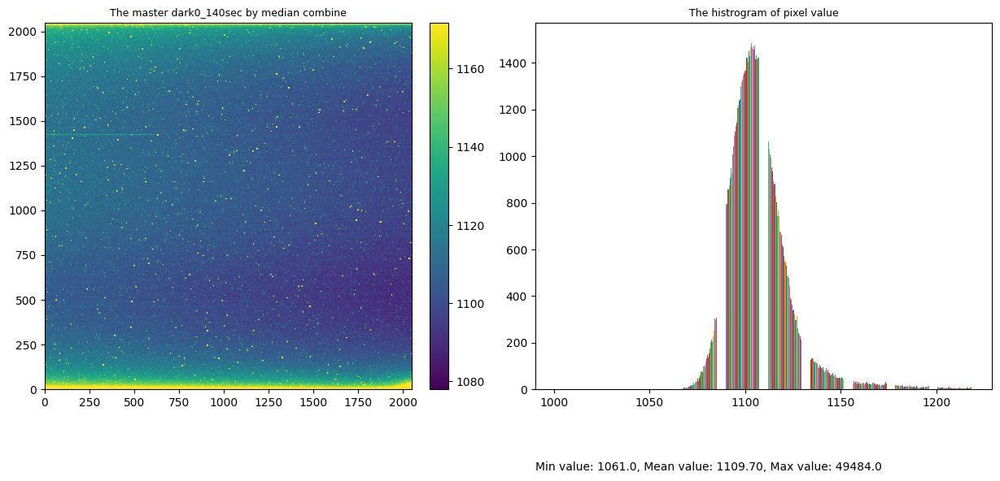

In [36]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            dark0_140sec.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(dark0_140sec.data,
                range=(dark0_140sec.data.mean()*.9, dark0_140sec.data.mean()*1.1),
                )

axs[0].set_title(f'The master dark0_140sec by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {dark0_140sec.data.min()}, Mean value: {dark0_140sec.data.mean():.02f}, Max value: {dark0_140sec.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### 화면에 출력하기 (dark0_180sec)

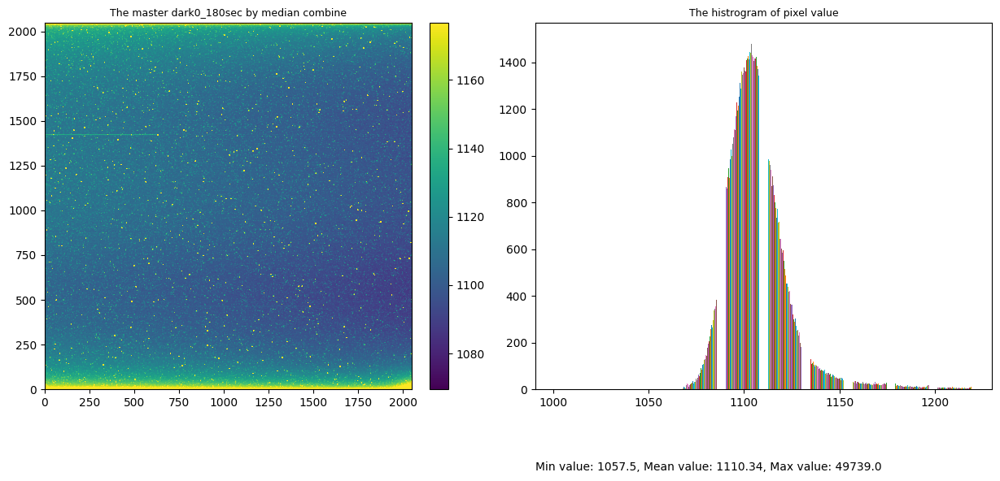

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            dark0_180sec.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(dark0_180sec.data,
                range=(dark0_180sec.data.mean()*.9, dark0_180sec.data.mean()*1.1),
                )

axs[0].set_title(f'The master dark0_180sec by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {dark0_180sec.data.min()}, Mean value: {dark0_180sec.data.mean():.02f}, Max value: {dark0_180sec.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

한장의 파일과 어떤 차이가 있는지 비교해 보자.

preprocessing_example/dark-e-2X2-140sec-011.fit


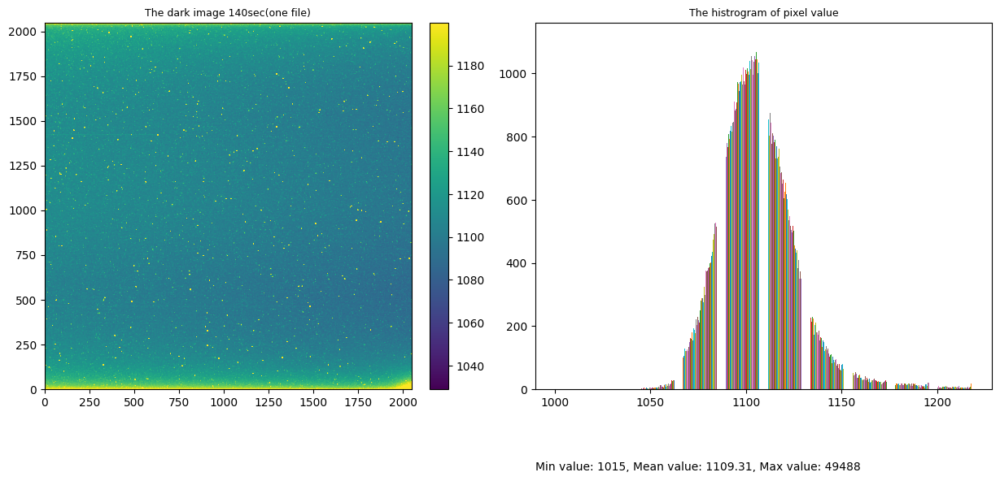

In [38]:
fpath = dark_140sec_list[0]
print(fpath)
hdul = fits.open(fpath)

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            hdul[0].data,
            cmap='viridis',
            origin='lower',)

im2 = axs[1].hist(hdul[0].data,
                  range=(hdul[0].data.mean()*.9, hdul[0].data.mean()*1.1),
                  )

axs[0].set_title(f'The dark image 140sec(one file)', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

개개의 이미지와 비교해 보는 것도 좋을것 같습니다.

preprocessing_example/dark-e-2X2-180sec-016.fit


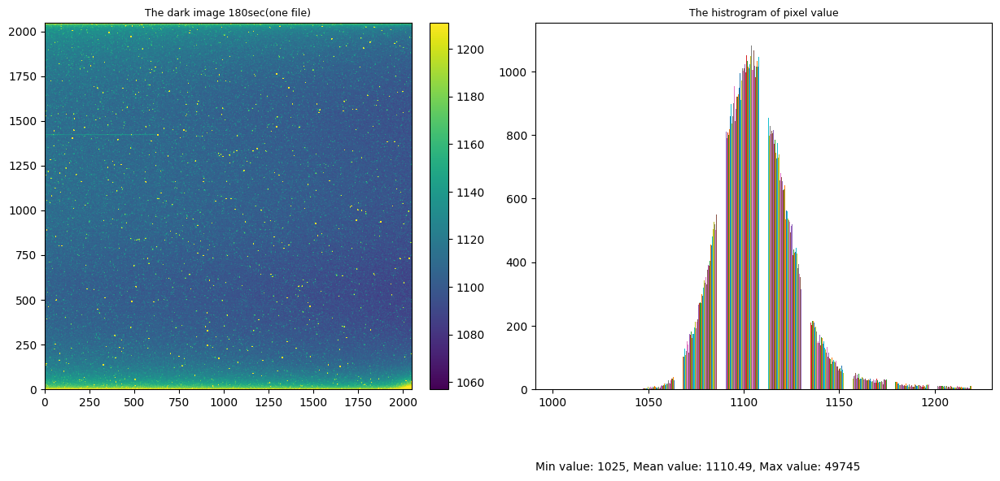

In [39]:
fpath = dark_180sec_list[0]
print(fpath)
hdul = fits.open(fpath)

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            hdul[0].data,
            cmap='viridis',
            origin='lower',)

im2 = axs[1].hist(hdul[0].data,
                  range=(hdul[0].data.mean()*.9, hdul[0].data.mean()*1.1),
                  )

axs[0].set_title(f'The dark image 180sec(one file)', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### bias 빼주기

In [40]:
from ccdproc import CCDData, ccd_process
# Subtract bias:
dark_140sec = ccd_process(dark0_140sec, master_bias = bias)
dark_180sec = ccd_process(dark0_180sec, master_bias = bias)

dark_140sec.data = dark_140sec.data.astype(np.float32)
dark_180sec.data = dark_180sec.data.astype(np.float32)

### 화면에 출력하기

면저 140sec master dark 파일을 화면에 디스플레이 해 보겠습니다. 최댓값을 보면 47,424 ADU 값임을 알 수 있다. 이는 bad pixel 임을 유추해 볼 수 있습니다.

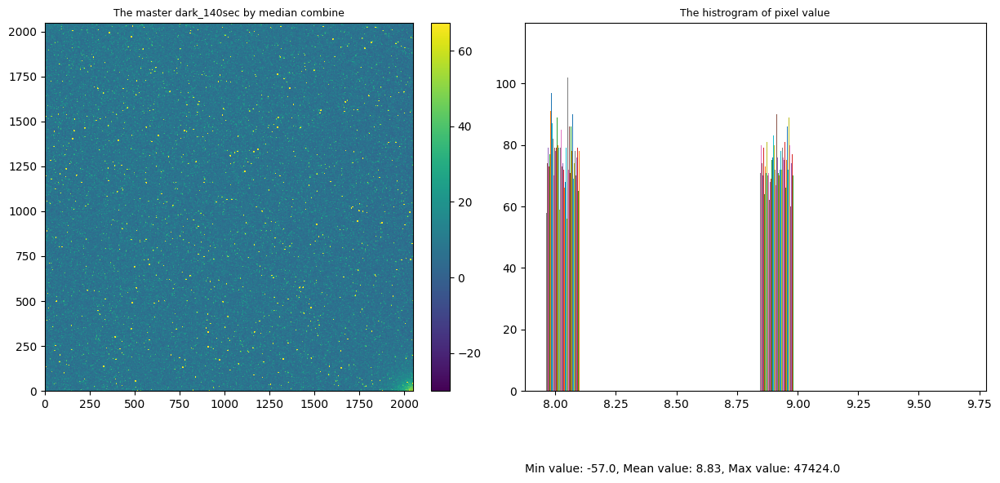

In [41]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            dark_140sec.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(dark_140sec.data,
            range=(dark_140sec.data.mean()*.9, dark_140sec.data.mean()*1.1),
            )

axs[0].set_title(f'The master dark_140sec by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {dark_140sec.data.min()}, Mean value: {dark_140sec.data.mean():.02f}, Max value: {dark_140sec.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

먼저 180sec master dark 파일을 화면에 디스플레이 해 보겠습니다. 최댓값을 보면 48399 ADU 값임을 알 수 있다. 이는 bad pixel 임을 유추해 볼 수 있습니다.

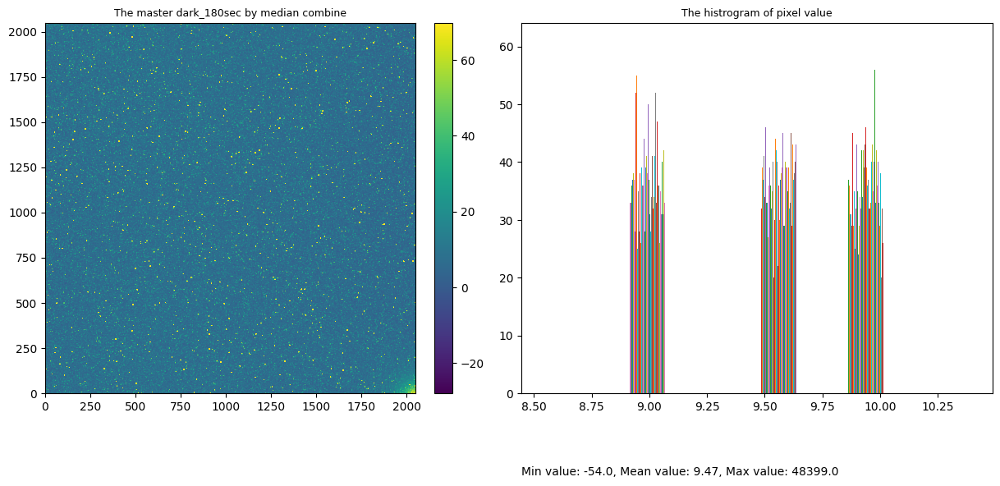

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            dark_180sec.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(dark_180sec.data,
            range=(dark_180sec.data.mean()*.9, dark_180sec.data.mean()*1.1),
            )

axs[0].set_title(f'The master dark_180sec by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {dark_180sec.data.min()}, Mean value: {dark_180sec.data.mean():.02f}, Max value: {dark_180sec.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### 저장하기



In [43]:
# Save
dark_140sec.write(f"{(BASEPATH/save_dir_name)}/master_dark_140sec_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_dark_140sec_{method}.fits is created...")

dark_180sec.write(f"{(BASEPATH/save_dir_name)}/master_dark_180sec_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_dark_180sec_{method}.fits is created...")

preprocessing_example/master_dark_140sec_median.fits is created...
preprocessing_example/master_dark_180sec_median.fits is created...


### 부분 확대해서 확인하기

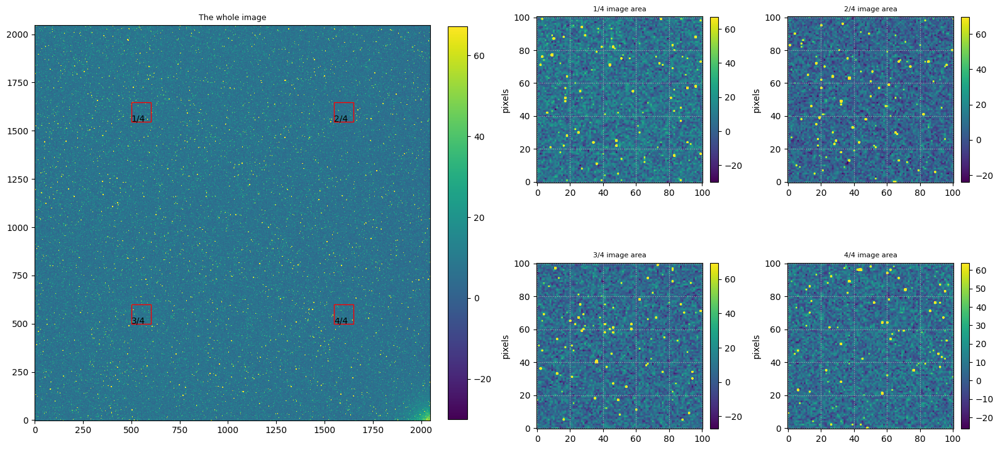

In [44]:
plot_image_with_cutouts(dark_140sec.data)

## Dealing with flat

다음으로 생각해 보아야 할 것은 픽셀들 간의 양자 효율에 대해서 생각해 보아야 합니다. 다시 말해 를 이루고 있는 픽셀들이 똑같은 빛에 대해서 똑같은 비율로 반응하는가 하는 점에 대해 생각해 볼 필요가 있습니다. 또한 광학계의 vignetting이나, filter 앞의 먼지 등으로 같은 밝기가 같은 픽셀 값을 나타내지 않을 수 있습니다.

이 error는 다음과 같이 flat frame을 촬영하여 보정할 수 있습니다. flat frame을 촬영하여 bias와 dark를 제거하여 master flat을 만드는 과정은 다음과 같습니다.

* 해 질 무렵 동쪽 하늘이나 해 뜰 무렵 서쪽하늘을 이 flat 한 하늘로 볼 수 있습니다. $ADU$ 값이 25,000 전후가 되도록 flat image를 가능한 한 여려 장(10 ~ 20 frame) 촬영합니다.
* 필터를 사용할 경우 각각의 필터 마다 flat frame을 촬영해야 합니다.
* all flat image를 median 방법으로 combine "flat0-median.fits"로 저장합니다.
* flat0 값에서 bias 와 dark (dark should be scaled)
* save it as "flat.fits"
* save it as "flat-median.fits"

* 다만 저장시에 data type에 유의해야 하는데, ccdproc로 저장한후 data type을 확인해야 할 필요가 있습니다.

flat image에는 spatial variation이 있기 때문에 rejected pixel values 들을 모든 픽셀의 median value로 대체 할 수 없습니다. 보통은 lower limit of pixel value (`min_value`)를 설정하고 이 값보다 작은 픽셀 값을 바꾸는 것이 일반적인 방법입니다. 'min_value '보다 작은 픽셀을 'min_value'로 변경하겠습니다.

앞서 언급했지만 dark frame은 노출시간에 맞게 `dark(t)/t * t'` 의 방법으로 "scaled" 되어야 합니다. 이 과정은 `ccd_process` fucntion 의 "`dark_scale`" 에서 자동 조정됩니다.


### flat 파일 리스트 만들기

flat은 필터의 영향을 받기 때문에 필터별로 따로 다루어야 합니다. 이번 예시에서는 모두 V 필터로 관측하였습니다. 파일 이름에 규칙성이 있다면 다음과 같이 파일 경로를 리스트로 만들어서 사용할 수 있습니다.

In [45]:
flat_list = sorted(list((BASEPATH/save_dir_name).glob('*flatV*.fit*')))
print(f"flat_list: {flat_list}")
print(f"len(flat_list): {len(flat_list)}")

flat_list: [PosixPath('preprocessing_example/flatV-e-2X2-021.fit'), PosixPath('preprocessing_example/flatV-e-2X2-022.fit'), PosixPath('preprocessing_example/flatV-e-2X2-023.fit'), PosixPath('preprocessing_example/flatV-e-2X2-024.fit'), PosixPath('preprocessing_example/flatV-e-2X2-025.fit')]
len(flat_list): 5


### master flat0 만들기

ccdproc의 combine 함수를 이용하면 여러 장의 flat 이미지를 통계적으로 처리할 수 있습니다.

기본적으로는 여러장의 이미지로부터 각 픽셀의 통계값을 구하는데 기본은 average 값을 구하게 됩니다. 만약 median 값을 구하고자 하는 경우 method를 "median"을 입력해 주면 되며, 마스타 바이어스 프레임은 "median"이 더 유용할 것으로 생각됩니다.

In [46]:
flat0 = combine(flat_list,       # ccdproc does not accept numpy.ndarray, but only python list.
               method='median',         # default is average so I specified median.
               unit='adu')

# float32로 변환
flat0.data = flat0.data.astype(np.float32)

### 저장하기

In [47]:
# write fits file
flat0.write(f"{(BASEPATH/save_dir_name)}/master_flat0_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_flat0_{method}.fits is created...")

preprocessing_example/master_flat0_median.fits is created...


### 화면에 출력하기 (flat0)

화면에 디스플레이 해 보자.

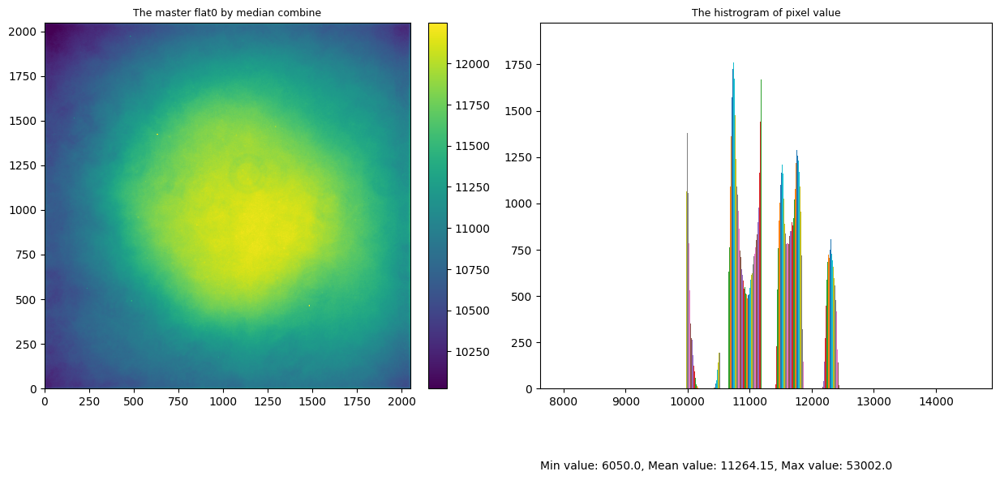

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], flat0.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(flat0.data,
                range=(flat0.data.mean()*.7, flat0.data.mean()*1.3),
                )

axs[0].set_title(f'The master flat0 by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {flat0.data.min()}, Mean value: {flat0.data.mean():.02f}, Max value: {flat0.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

개개의 이미지와 비교해 보는 것도 좋을것 같습니다.

preprocessing_example/flatV-e-2X2-021.fit


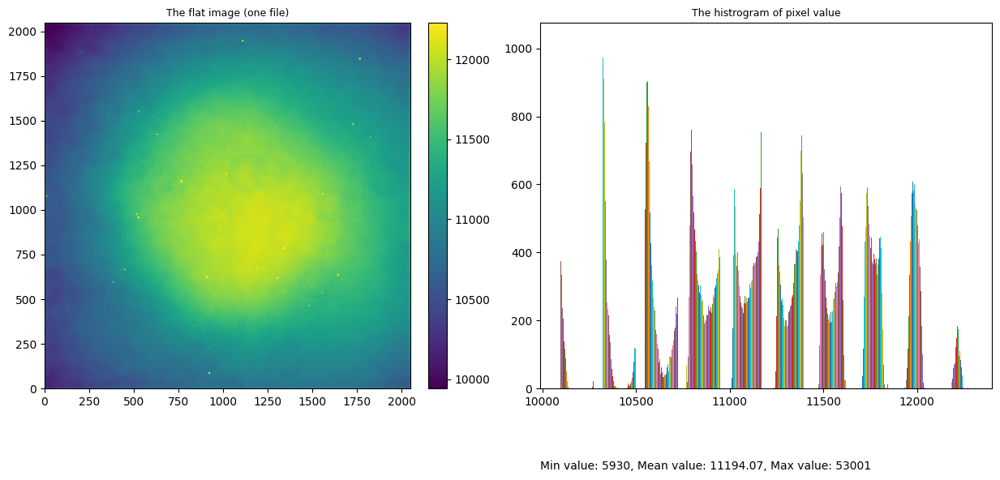

In [49]:
fpath = flat_list[0]
print(fpath)
hdul = fits.open(fpath)

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0],
            hdul[0].data,
            cmap='viridis',
            origin='lower',)

im2 = axs[1].hist(hdul[0].data,
                  range=(hdul[0].data.mean()*.9, hdul[0].data.mean()*1.1),
                  )

axs[0].set_title(f'The flat image (one file)', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### bias, dark 빼주기 (flat)

In [51]:
import astropy.units as u

# Subtract bias and dark
flat = ccd_process(flat0,                  # The input image (median combined flat)
                   master_bias = bias,       # Master bias
                   dark_frame = dark_140sec,        # dark
                   exposure_key='exptime', # the header keyword for exposure time
                   exposure_unit=u.s,      # the unit of exposure time
                   dark_scale=True,
                   )        # whether to scale dark frame

# float32로 변환
flat.data = flat.data.astype(np.float32)

#print('flat', flat.data.dtype, flat.data.min(), flat.data.max(), flat)

flat.write(f"{(BASEPATH/save_dir_name)}/master_flat_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_flat_{method}.fits is created...")

preprocessing_example/master_flat_median.fits is created...


### 화면에 출력하기 (flat)

화면에 디스플레이 해 보자.

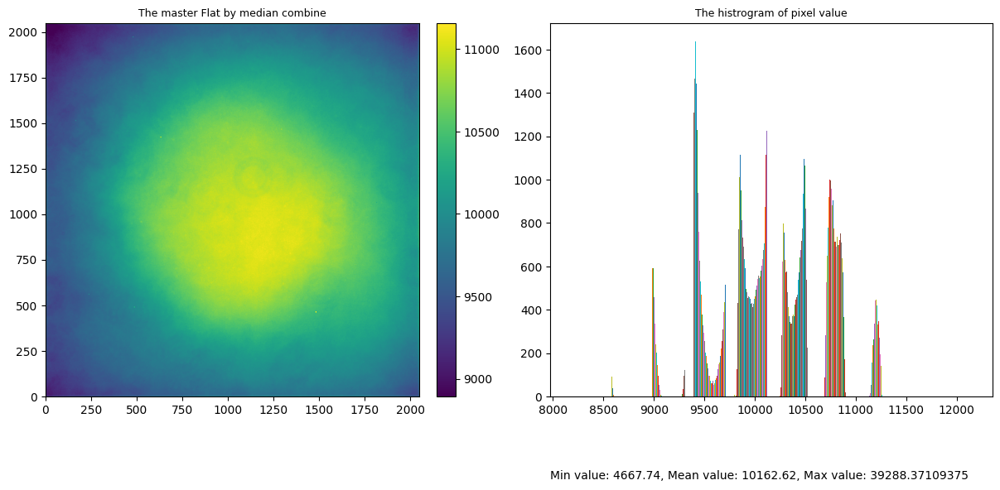

In [52]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], flat.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(flat.data,
                range=(flat.data.mean()*.8, flat.data.mean()*1.2),
                )

axs[0].set_title(f'The master Flat by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {flat.data.min():.02f}, Mean value: {flat.data.mean():.02f}, Max value: {flat.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### 부분 확대해서 확인하기

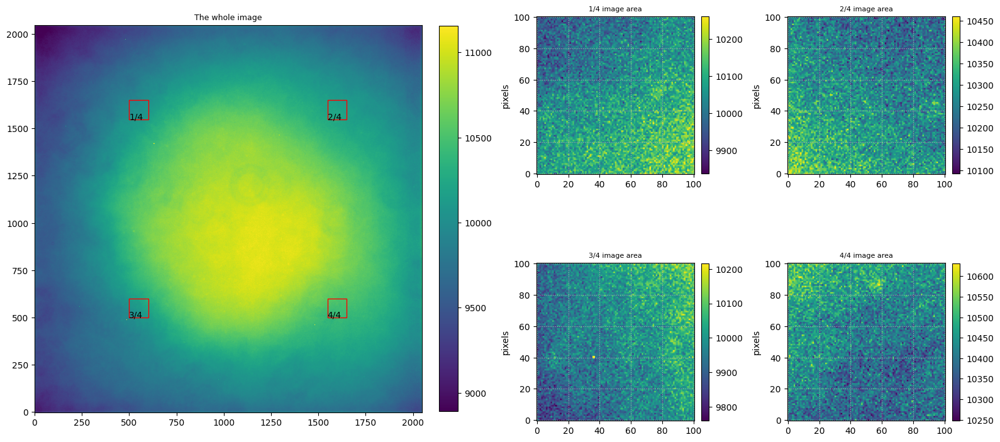

In [53]:
plot_image_with_cutouts(flat.data)

### normalized flat

In [54]:
flat_norm = flat.copy()
flat_norm.data = flat.data/flat.data.mean()

flat_norm.write(f"{(BASEPATH/save_dir_name)}/master_flat_norm_{method}.fits", overwrite =True)
print(f"{(BASEPATH/save_dir_name)}/master_flat_norm_{method}.fits is created...")

preprocessing_example/master_flat_norm_median.fits is created...


화면에 display 해 보자.

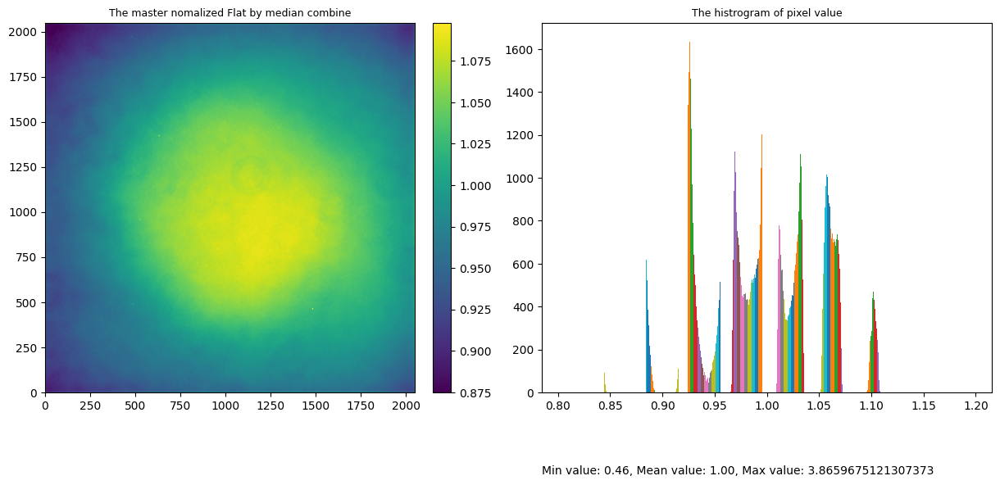

In [55]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], flat_norm.data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(flat_norm.data,
                range=(flat_norm.data.mean()*.8, flat_norm.data.mean()*1.2),
                )

axs[0].set_title(f'The master nomalized Flat by median combine', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {flat_norm.data.min():.02f}, Mean value: {flat_norm.data.mean():.02f}, Max value: {flat_norm.data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

## Reducing Object Images


### 파일 리스트 만들기

파일 이름에 규칙성이 있다면 이를 이용하여 다음과 같이 파일 경로를 리스트로 만들어서 사용할 수 있습니다.

In [57]:
object_M35_list = sorted(list((BASEPATH/save_dir_name).glob('M35*.fit*')))
print(f"object_list: {object_M35_list}")
print(f"len(object_list): {len(object_M35_list)}")

object_list: [PosixPath('preprocessing_example/M35-g3035781.fit'), PosixPath('preprocessing_example/M35-g3035782.fit'), PosixPath('preprocessing_example/M35-g3035783.fit'), PosixPath('preprocessing_example/M35-g3035784.fit'), PosixPath('preprocessing_example/M35-g3035785.fit'), PosixPath('preprocessing_example/M35-g3035786.fit'), PosixPath('preprocessing_example/M35-g3035787.fit'), PosixPath('preprocessing_example/M35-g3035788.fit'), PosixPath('preprocessing_example/M35-g3035789.fit'), PosixPath('preprocessing_example/M35-g3035790.fit')]
len(object_list): 10


### No dark scale

위의 과정으로 master bias, master dark, 그리고 master flat (median combined flat - (bias + dark))을 만들었다면 간단하게 (object - (bias + dark)) / (master flat) 과정으로 calibration을 할 수 있습니다.

이 모든 preprocessing 과정을 한번에 하는 방법은 다음과 같습니다.

#### 전처리

In [79]:
from ccdproc import CCDData, ccd_process

# Reduce each object image separately.
# Then save it with prefix 'reduced_' which means "preprocessed"
for fpath in object_M35_list:
    obj = CCDData.read(str(fpath), unit='adu')
    reduced = ccd_process(obj,                    # The input image
                          master_bias = bias,       # Master bias
                          dark_frame = dark_140sec,        # dark
                          master_flat = flat0,      # non-calibrated flat
                          min_value = flat.data.min(),        # flat.min() should be 30000
                          exposure_key = 'exptime', # exposure time keyword
                          exposure_unit = u.s,      # exposure time unit
                          dark_scale = False,        # whether to scale dark frame
                          )
    reduced.data = np.array(reduced.data, dtype=np.uint32)
    print('reduced', reduced.data.dtype, reduced.data.min(), reduced.data.max(), reduced)
    reduced.write(f"{(BASEPATH/save_dir_name)}/reduced_{fpath.name}", overwrite =True)
    print(f"{(BASEPATH/save_dir_name)}/reduced_{fpath.name} is created...")

reduced uint32 1450 59253 [[15094 15268 15266 ... 15337 15324 14982]
 [15377 15265 15323 ... 15412 15485 15368]
 [15287 15059 15006 ... 15127 15429 14963]
 ...
 [15297 15177 15235 ... 15750 15265 15684]
 [15045 15053 15381 ... 15169 15292 15237]
 [13350 13468 13160 ... 13503 14003 13686]] adu
preprocessing_example/reduced_M35-g3035781.fit is created...
reduced uint32 1342 58505 [[14165 14086 13963 ... 12874 13045 13036]
 [14027 14253 14088 ... 13100 13379 13022]
 [14140 14282 14084 ... 12935 13065 12937]
 ...
 [14171 14005 14032 ... 12845 12637 12533]
 [13830 14018 14209 ... 12532 12807 12383]
 [12359 12395 12368 ... 11173 11392 11210]] adu
preprocessing_example/reduced_M35-g3035782.fit is created...
reduced uint32 1296 58540 [[13769 13463 13744 ... 13719 13621 13474]
 [13825 13735 13838 ... 13675 13847 13718]
 [13817 13526 13521 ... 13501 13761 13498]
 ...
 [13710 13899 13634 ... 14084 13863 13833]
 [13526 13555 13698 ... 13526 13617 13689]
 [11890 11872 11966 ... 12384 12368 12179]] 

#### 결과

전처리한 결과를 비교해 보겠습니다.


preprocessing_example/M35-g3035781.fit
hdul : [<astropy.io.fits.hdu.image.PrimaryHDU object at 0x7cd373213490>, <astropy.io.fits.hdu.image.ImageHDU object at 0x7cd39702d5a0>]


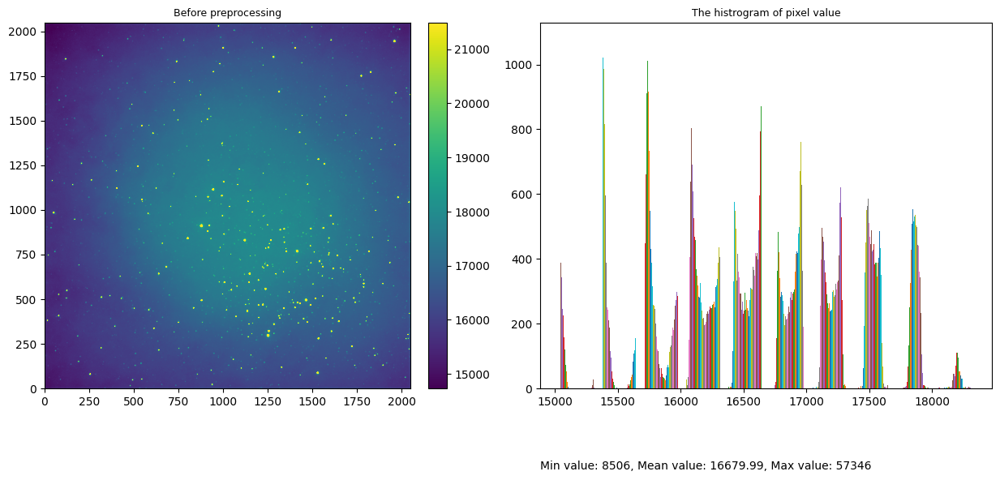

In [73]:
fpath = object_M35_list[0]
print(fpath)
hdul_bf = fits.open(str(fpath))
print("hdul : {}".format(hdul))

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], hdul_bf[0].data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(hdul_bf[0].data,
                range=(hdul_bf[0].data.mean()*.9, hdul_bf[0].data.mean()*1.1),
                )

axs[0].set_title(f'Before preprocessing', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul_bf[0].data.min()}, Mean value: {hdul_bf[0].data.mean():.02f}, Max value: {hdul_bf[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()


preprocessing_example/reduced_M35-g3035781.fit


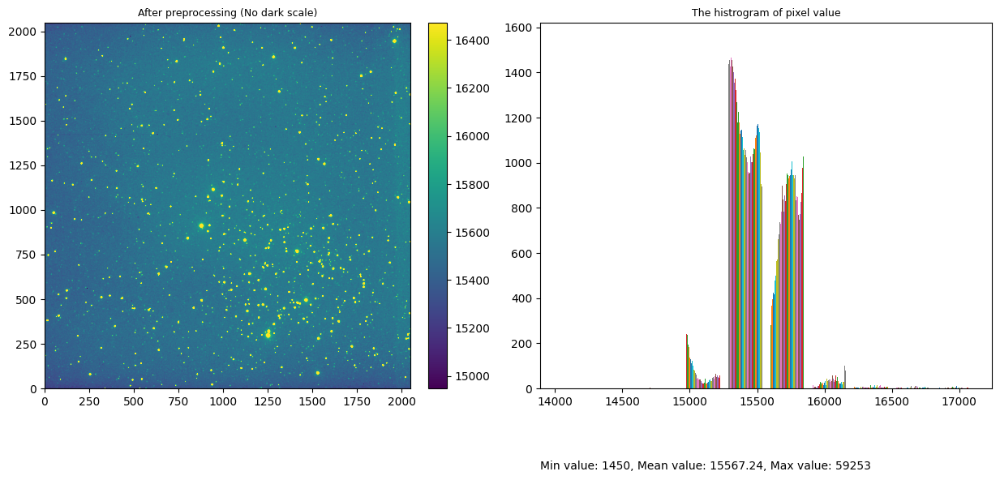

In [80]:
fpath = object_M35_list[0]
reduced_fpath = (BASEPATH/save_dir_name)/f"reduced_{fpath.name}"
print(reduced_fpath)
hdul_af = fits.open(str(reduced_fpath))

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], hdul_af[0].data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(hdul_af[0].data,
                range=(hdul_af[0].data.mean()*.9, hdul_af[0].data.mean()*1.1),
                )

axs[0].set_title(f'After preprocessing (No dark scale)', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul_af[0].data.min()}, Mean value: {hdul_af[0].data.mean():.02f}, Max value: {hdul_af[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### dark scale

위의 과정으로 master bias, master dark, 그리고 master flat (median combined flat - (bias + dark))을 만들었다면 간단하게 (object - (bias + dark)) / (master flat) 과정으로 calibration을 할 수 있습니다.

이 모든 preprocessing 과정을 한번에 하는 방법은 다음과 같습니다.

#### 전처리

In [68]:
from ccdproc import CCDData, ccd_process
import astropy.units as u

for fpath in object_M35_list:
    obj = CCDData.read(str(fpath), unit='adu')
    reduced_darksc = ccd_process(obj,                    # The input image
                          master_bias = bias,       # Master bias
                          dark_frame = dark_180sec,        # dark
                          master_flat = flat0,      # non-calibrated flat
                          min_value = flat.data.min(),        # flat.min() should be 30000
                          exposure_key = 'exptime', # exposure time keyword
                          exposure_unit = u.s,      # exposure time unit
                          dark_scale = True,        # whether to scale dark frame
                          )
    reduced_darksc.data = np.array(reduced_darksc.data, dtype=np.uint32)
    print('reduced_darksc', reduced_darksc.data.dtype, reduced_darksc.data.min(), reduced_darksc.data.max(), reduced_darksc)
    reduced_darksc.write(f"{(BASEPATH/save_dir_name)}/reduced_darksc_{fpath.name}", overwrite =True)
    print(f"{(BASEPATH/save_dir_name)}/reduced_darksc_{fpath.name} is created...")

reduced_darksc uint32 2755 59252 [[15091 15285 15271 ... 15323 15343 15011]
 [15369 15250 15321 ... 15404 15499 15365]
 [15302 15064 14992 ... 15143 15442 14972]
 ...
 [15296 15183 15251 ... 15757 15275 15693]
 [15060 15070 15395 ... 15192 15301 15246]
 [13386 13458 13169 ... 13499 14014 13736]] adu
preprocessing_example/reduced_darksc_M35-g3035781.fit is created...
reduced_darksc uint32 2648 58509 [[14163 14103 13968 ... 12859 13065 13064]
 [14019 14239 14086 ... 13093 13394 13019]
 [14156 14287 14069 ... 12951 13078 12947]
 ...
 [14170 14011 14049 ... 12852 12648 12541]
 [13845 14035 14223 ... 12555 12816 12392]
 [12395 12385 12377 ... 11169 11403 11261]] adu
preprocessing_example/reduced_darksc_M35-g3035782.fit is created...
reduced_darksc uint32 2602 58556 [[13767 13481 13749 ... 13704 13641 13503]
 [13817 13720 13836 ... 13668 13862 13715]
 [13833 13531 13507 ... 13517 13773 13508]
 ...
 [13708 13905 13651 ... 14091 13873 13841]
 [13541 13572 13712 ... 13550 13626 13698]
 [11926 1

#### 결과

전처리한 결과를 비교해 보겠습니다.


preprocessing_example/reduced_darksc_M35-g3035781.fit


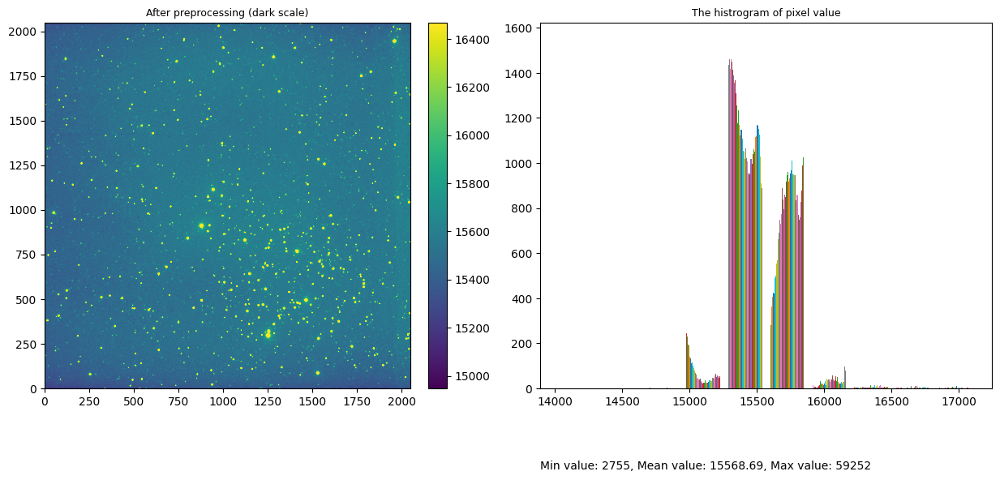

In [69]:
fpath = object_M35_list[0]
reduced_darksc_fpath = (BASEPATH/save_dir_name)/f"reduced_darksc_{fpath.name}"
print(reduced_darksc_fpath)
hdul_af_darksc = fits.open(str(reduced_darksc_fpath))

fig, axs = plt.subplots(1, 2, figsize=(13, 6),
                        sharex=False, sharey=False, gridspec_kw=None)

im1 = zimshow(axs[0], hdul_af_darksc[0].data,
            origin='lower',
            cmap='viridis',
            )

im2 = axs[1].hist(hdul_af_darksc[0].data,
                range=(hdul_af_darksc[0].data.mean()*.9, hdul_af_darksc[0].data.mean()*1.1),
                )

axs[0].set_title(f'After preprocessing (dark scale)', fontsize=9)
axs[1].set_title('The histrogram of pixel value', fontsize=9)

plt.colorbar(im1, fraction=0.0455, pad=0.04)
plt.annotate(f"Min value: {hdul_af_darksc[0].data.min()}, Mean value: {hdul_af_darksc[0].data.mean():.02f}, Max value: {hdul_af_darksc[0].data.max()}",
             xy=(0, -100), xycoords='axes pixels')
plt.tight_layout(pad=1.0)
plt.show()

### 부분 확대해서 확인하기

Dark scale을 사용한 것과 그렇지 않은 것에 큰 차이는 없어 보입니다. 그렇지만 가능하면 같은 노출시간의 dark frame을 촬영하여 전처리 하는 것이 바람직 합니다.

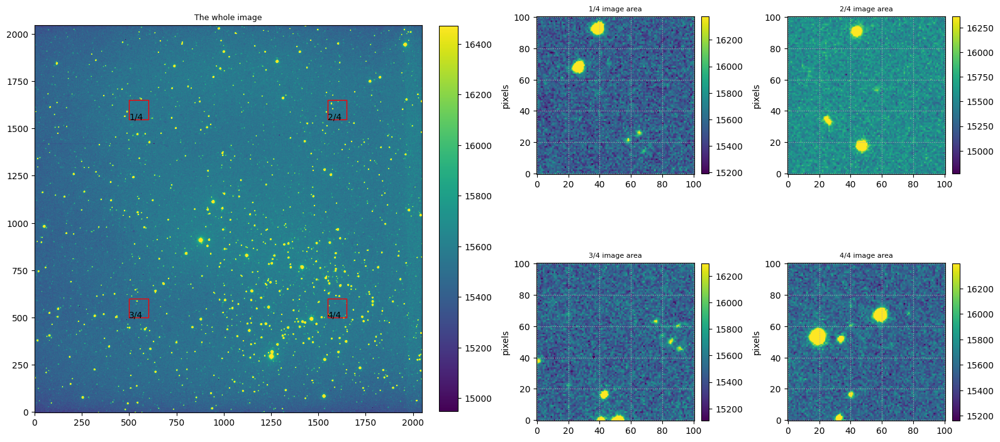

In [70]:
plot_image_with_cutouts(hdul_af[0].data)

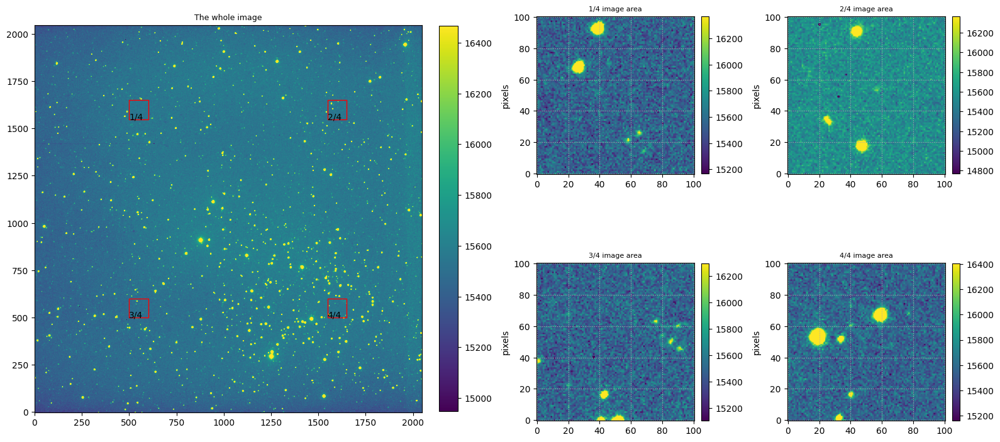

In [71]:
plot_image_with_cutouts(hdul_af_darksc[0].data)

##(과제)

1. M15를 관측한 5개의 파일 모두를 전처리를 수행하시오. (dark scale을 적용해야 함)

In [ ]:
# (과제) 아래에 코딩을 완성하여 제출하시오.

object_M15_list = sorted(list((BASEPATH/save_dir_name).glob('M15*.fit*')))
print(f"object_list: {object_M15_list}")
print(f"len(object_list): {len(object_M15_list)}")




##(과제)

2. 그리고 전처리된 M15 5개의 파일을 모두 display 하시오.

In [ ]:
# (과제) 아래에 코딩을 완성하여 제출하시오.


